# Figure 2: Connectivity

In [1]:
import os
import numpy as np
from aisynphys.database import SynphysDatabase
from aisynphys.cell_class import CellClass, classify_cells, classify_pairs
from aisynphys.connectivity import GaussianModel, recip_connectivity_profile, connectivity_profile, adjust_cp, MouseConnectivityModel
import matplotlib.colors, matplotlib.cm
import matplotlib.pyplot as plt
from matplotlib import gridspec
from collections import OrderedDict
from aisynphys.ui.notebook import show_connectivity_matrix, show_connectivity_profile, show_connectivity_fit, show_distance_binned_cp, show_connectivity_raster, set_distance_xticks, compose_svg_figure
import warnings; warnings.simplefilter('ignore')
%matplotlib inline
matplotlib.rcParams['font.sans-serif'] = "Arial"

db = SynphysDatabase.load_current('medium')
print(db.schema_version)

21


##### Load all mouse data

In [2]:
projects = ['mouse V1 coarse matrix', 'mouse V1 pre-production']
mouse_pairs = db.pair_query(project_name=projects).all()
print("loaded %d cell pairs" % len(mouse_pairs))

loaded 83006 cell pairs


In [3]:
mouse_model = MouseConnectivityModel(db=db)
mouse_model.build_ei_model(mouse_pairs)
ei_connectivity = mouse_model.connectivity_model
filtered_pairs = [p for p in mouse_model.pairs if mouse_model.filter_pair(p, mouse_model.pairs)]

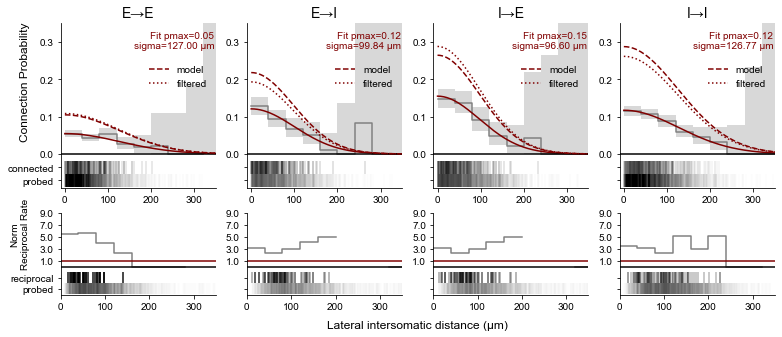

In [4]:
import seaborn as sns
colors = sns.color_palette("Set2", n_colors=5)
title = {'ex': 'E', 'in': 'I'}

x_bins = np.arange(0, 400e-6, 40e-6)
x_vals = np.linspace(x_bins[0], x_bins[-1], 200)

fig_a = plt.figure(figsize=(3.2*len(ei_connectivity), 5))

grid = gridspec.GridSpec(2, len(ei_connectivity), height_ratios=[1,0.5])
ax = [[fig_a.add_subplot(grid[x, y]) for y in range(len(ei_connectivity))] for x in [0, 1]]

for i, (pair_class, results) in enumerate(ei_connectivity.items()):
    dist = results['lat_dist']
    probed_pairs = results['probed_pairs']
    conn = np.array([p.has_synapse for p in probed_pairs], dtype=bool)
    fit = results['lat_dist_fit']
    show_connectivity_profile(dist, conn, ax[0][i], fit, ymax=0.35)
    if i>0:
        y_labels = ax[0][i].get_yticklabels()
        y_labels[0].set_text('')
        y_labels[1].set_text('')
        ax[0][i].set_yticklabels(y_labels)

    label = ( "Fit pmax=%0.2f\nsigma=%0.2f µm" % (fit.pmax, fit.size*1e6))
    ax[0][i].text(0.99, 0.85, label, transform=ax[0][i].transAxes, color=(0.5, 0, 0), horizontalalignment='right', fontsize=10)
    ax[0][i].set_title("%s→%s" % (title[pair_class[0]], title[pair_class[1]]), fontsize=14)
    ax[0][i].set_xlim(-10e-6, 350e-6)
    ax[0][i].spines['right'].set_visible(False)
    ax[0][i].spines['top'].set_visible(False)
    
    # plot model adjusted Cp
    adjusted_pmax, adjusted_ci_lower, adjusted_ci_upper = results['adjusted_cp_fit'].cp_ci
    fixed_sigma = results['fixed_sigma']
    plot_corr_model = GaussianModel(pmax=adjusted_pmax, size=fixed_sigma)
    ax[0][i].plot(x_vals, plot_corr_model.connection_probability(x_vals), color=(0.5, 0, 0), linestyle='--', label='model')
    
    # plot filtered Cp
    filt_pairs = [p for p in probed_pairs if p in filtered_pairs]
    filt_conn = np.array([p.has_synapse for p in filt_pairs], dtype=bool)
    filt_model = GaussianModel(pmax=sum(filt_conn)/len(filt_pairs), size=fixed_sigma)
    
    ax[0][i].plot(x_vals, filt_model.connection_probability(x_vals), color=(0.5, 0, 0), linestyle='dotted', label='filtered')
    ax[0][i].legend(loc='upper right', bbox_to_anchor=(1, 0.8), frameon=False)
    
    ax[0][0].set_ylabel('Connection Probability', fontsize=12)
    ax[0][0].yaxis.set_label_coords(-0.2, 0.65)
    
    # calculate and plot reciprocal connectivity
    ymax = 9
    if pair_class != pair_class[::-1]:
        results_2 = ei_connectivity[pair_class[::-1]]
    else:
        results_2 = results
    norm_cp_r, recip_conn, recip_dist = recip_connectivity_profile(results['probed_pairs'], results_2['probed_pairs'], x_bins)
    show_distance_binned_cp(x_bins, norm_cp_r, ax[1][i])
    tickheight = ymax / 5
    show_connectivity_raster(recip_dist, recip_conn, tickheight, ax[1][i])
    set_distance_xticks(x_vals, ax[1][i], interval=100e-6)
    set_distance_xticks(x_vals, ax[0][i], interval=100e-6)
   
    y_vals = np.arange(1, ymax + 0.5, 2)
    ax[1][i].set_yticks([-tickheight*2, -tickheight] + list(y_vals))
    if i==0:
        ax[1][i].set_yticklabels(['probed', 'reciprocal'] + ['%.1f'%x for x in y_vals])
    else:
        ax[1][i].set_yticklabels(['', ''] + ['%.1f'%x for x in y_vals])
    ax[1][i].set_ylim(-tickheight*2.6, ymax)
    ax[1][i].axhline(0, color=(0,0,0))
    ax[1][i].axhline(1, color=(0.5, 0, 0))
    ax[1][i].spines['right'].set_visible(False)
    ax[1][i].spines['top'].set_visible(False)

    ax[1][i].set_xlim(0, 350e-6)
    
    ax[1][0].set_ylabel('Norm\nReciprocal Rate', fontsize=10)
    ax[1][0].yaxis.set_label_coords(-0.2, 0.75)
    
_ = [ax[0][i].set_xlabel('') for i in range(0, 4)]
_ = [ax[1][i].set_xlabel('') for i in range(0, 4)]
ax[1][0].set_xlabel('Lateral intersomatic distance (µm)', fontsize=12)
ax[1][0].xaxis.set_label_coords(2.3, -0.3)

In [40]:
label_opts = {'size': '16pt', 'font': 'arial', 'weight': 'bold'}

figure_spec = [
    {'figure': fig_a, 'pos': (0, 20), 'label': '', 'label_opts': label_opts},
]

compose_svg_figure(
    figure_spec, 
    size=("8in", "10in"), 
    filename=os.path.join('generated_svg', 'fig2A_nomodel.svg'), 
    display=True
)

In [19]:
def sigma_simulation(data, sigma_range, model=GaussianModel, n_trials=1000):
# data is a nested dictionary like:
# {'syn_type': {'connectivity_fit': model_fit, 'probed_distances': numpy distance array}, 'syn_type': {}...}

    results = {}
    for sigma in sigma_range:

        results[sigma] = {syn_type: [] for syn_type in data.keys()}
        for n in range(n_trials):
            for syn_type, values in data.items():
                pmax = values['lat_dist_fit'].pmax
                probed_pairs = values['probed_pairs']
                distances = np.array([p.lateral_distance for p in probed_pairs if p.lateral_distance is not None])
                true_model = model(pmax=pmax, size=sigma)
                conn = true_model.generate(distances)
                fit = model.fit(distances, conn)
                results[sigma][syn_type].append(fit)
    
    return results

In [ ]:
sigma_range = np.linspace(80e-6, 140e-6, 6)
sigma_results = sigma_simulation(ei_connectivity, sigma_range, n_trials=10000)

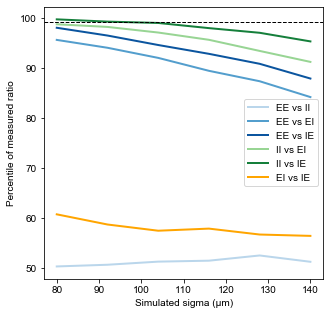

In [45]:
import scipy.stats as stats
import seaborn as sns

sigma_stats = {}
for sigma, result in sigma_results.items():
    for syn_type1, fits1 in result.items():
        for syn_type2, fits2 in result.items():
            if syn_type1==syn_type2:
                continue
            measured_ratio = ei_connectivity[syn_type1]['lat_dist_fit'].size / ei_connectivity[syn_type2]['lat_dist_fit'].size
            size1 = np.array([fit.size for fit in fits1])
            size2 = np.array([fit.size for fit in fits2])
            ratio = size1 / size2
            percentile = stats.percentileofscore(ratio, measured_ratio)
            if (syn_type1, syn_type2) not in sigma_stats.keys():
                sigma_stats[(syn_type1, syn_type2)] = {'ratio': [], 'percentile': []}
            sigma_stats[(syn_type1, syn_type2)]['ratio'].append(ratio)
            sigma_stats[(syn_type1, syn_type2)]['percentile'].append(percentile)
    
fig, ax = plt.subplots(figsize=(5, 5))
sigmas = [s*1e6 for s in sigma_results.keys()]
blues = sns.color_palette('Blues_r', n_colors=6)
greens = sns.color_palette('Greens_r', n_colors=4)

plot_groups = {
    (('ex', 'ex'), ('in', 'in')): {'label': 'EE vs II', 'color': blues[4]}, 
    (('ex', 'ex'), ('ex', 'in')): {'label': 'EE vs EI', 'color': blues[2]},
    (('ex', 'ex'), ('in', 'ex')): {'label': 'EE vs IE', 'color': blues[0]},
    (('in', 'in'), ('ex', 'in')): {'label': 'II vs EI', 'color': greens[2]},
    (('in', 'in'), ('in', 'ex')): {'label': 'II vs IE', 'color': greens[0]},
    (('ex', 'in'), ('in', 'ex')): {'label': 'EI vs IE', 'color': 'orange'},
}

for group, opts in plot_groups.items():
    percentiles = sigma_stats[group]['percentile']
    ax.plot(sigmas, percentiles, label=opts['label'], color=opts['color'], lw=2)
ax.axhline(99.17, color='k', ls='--', lw=1)
ax.set_xlabel('Simulated sigma (µm)')
ax.set_ylabel('Percentile of measured ratio')
ax.legend()

##### Define  and create Cell Classes for full matrix

In [5]:
cell_class_criteria = {
    'l23pyr': {'cell_class_nonsynaptic': 'ex',  'cortical_layer': '2/3'},
    'l23pv':  {'cre_type': 'pvalb',            'cortical_layer': '2/3', 'cell_class_nonsynaptic': 'in'},
    'l23sst': {'cre_type': 'sst',              'cortical_layer': '2/3', 'cell_class_nonsynaptic': 'in'},
    'l23vip': {'cre_type': 'vip',              'cortical_layer': '2/3', 'cell_class_nonsynaptic': 'in'},
    'l4pyr':  {'cre_type': ('nr5a1', 'rorb'),  'cortical_layer': '4', 'cell_class_nonsynaptic': 'ex'},
    'l4pv':   {'cre_type': 'pvalb',            'cortical_layer': '4',  'cell_class_nonsynaptic': 'in'},
    'l4sst':  {'cre_type': 'sst',              'cortical_layer': '4', 'cell_class_nonsynaptic': 'in'},
    'l4vip':  {'cre_type': 'vip',              'cortical_layer': '4', 'cell_class_nonsynaptic': 'in'},
   'l5et':   {'cre_type': ('sim1', 'fam84b'),  'cortical_layer': '5', 'cell_class_nonsynaptic': 'ex'},
    'l5it':   {'cre_type': 'tlx3',             'cortical_layer': '5', 'cell_class_nonsynaptic': 'ex'}, 
    'l5pv':   {'cre_type': 'pvalb',            'cortical_layer': '5', 'cell_class_nonsynaptic': 'in'},
    'l5sst':  {'cre_type': 'sst',              'cortical_layer': '5', 'cell_class_nonsynaptic': 'in'},
    'l5vip':  {'cre_type': 'vip',              'cortical_layer': '5', 'cell_class_nonsynaptic': 'in'},
    'l6pyr':  {'cre_type': 'ntsr1',            'cortical_layer': ('6a', '6b'), 'cell_class_nonsynaptic': 'ex'},
    'l6pv':   {'cre_type': 'pvalb',            'cortical_layer': ('6a', '6b'), 'cell_class_nonsynaptic': 'in'},
    'l6sst':  {'cre_type': 'sst',              'cortical_layer': ('6a', '6b'), 'cell_class_nonsynaptic': 'in'},
    'l6vip':  {'cre_type': 'vip',              'cortical_layer': ('6a', '6b'), 'cell_class_nonsynaptic': 'in'},
}

cell_classes = {name:CellClass(name=name, **criteria) for name,criteria in cell_class_criteria.items()}

In [6]:
# Group all cells by selected classes
cell_groups = classify_cells(cell_classes.values(), pairs=mouse_model.pairs, missing_attr='ignore')

# Group pairs into (pre_class, post_class) groups
pair_groups = classify_pairs(mouse_model.pairs, cell_groups)

# analyze matric elements
matrix_connectivity = mouse_model.model_adjust_cp(pair_groups)

### Display connectivity heatmap, Figure 2B

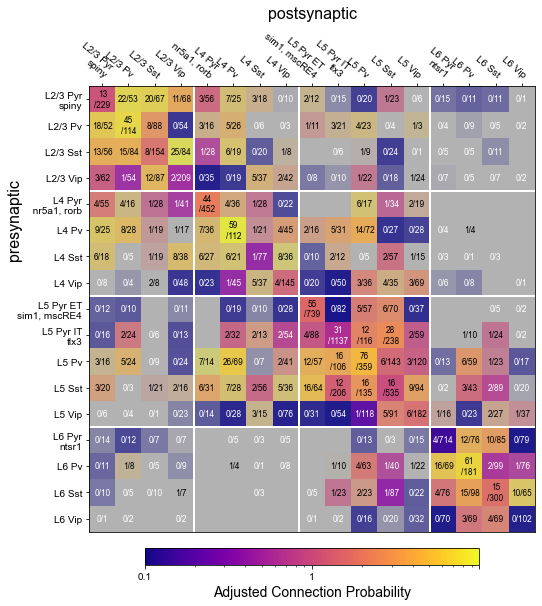

In [7]:
from aisynphys.ui.notebook import annotate_heatmap
# define a colormap and log normalization used to color the heatmap
norm = matplotlib.colors.LogNorm(vmin=0.01, vmax=1.0, clip=True)
cmap = matplotlib.cm.get_cmap('plasma')

# define the display labels to use for each cell subclass:
class_labels = {
    'l23pyr': 'L2/3 Pyr\nspiny',
    'l23pv':  'L2/3 Pv',
    'l23sst': 'L2/3 Sst',
    'l23vip': 'L2/3 Vip',
    'l4pyr':  'L4 Pyr\n nr5a1, rorb',
    'l4pv':   'L4 Pv',
    'l4sst':  'L4 Sst',
    'l4vip':  'L4 Vip',
    'l5et':   'L5 Pyr ET\nsim1, mscRE4',
    'l5it':   'L5 Pyr IT\ntlx3',
    'l5pv':   'L5 Pv',
    'l5sst':  'L5 Sst',
    'l5vip':  'L5 Vip',
    'l6pyr':  'L6 Pyr\nntsr1',
    'l6pv':   'L6 Pv',
    'l6sst':  'L6 Sst',
    'l6vip':  'L6 Vip',
}

# create a figure/axes to draw on
fig_b, ax = plt.subplots(figsize=(10, 10))

# finally, draw the colormap using the provided function:
im, cbar, labels = show_connectivity_matrix(
    ax=ax, 
    results=matrix_connectivity, 
    pre_cell_classes=cell_classes.values(), 
    post_cell_classes=cell_classes.values(), 
    class_labels=class_labels,
    cmap=cmap, 
    norm=norm,
    ctype='chemical',
    corrections_applied=True,
    layer_lines=[3.5, 7.5, 12.5], 
)

_ = [label.set_text(label.get_text().replace('/', '\n/')) for label in labels if len(label.get_text()) > 5]
_ = [label.set_fontsize(8.3) for label in labels]
cbar.remove()
cbar = fig_b.colorbar(im, ax=ax, orientation='horizontal', shrink=0.6, pad=0.03)
cbar.ax.set_xlabel('Adjusted Connection Probability', fontsize=14)
cbar.ax.set_xticklabels(['0.01', '0.1', '1'], fontsize=10)
_ = plt.setp(ax.get_xticklabels(), rotation=-40, ha="right", rotation_mode="anchor")
ax.yaxis.set_label_coords(-0.15, 0.7)

##### Measure distance profiles

In [8]:
def plot_element_connectivity_profile(element, connectivity_results, ymax, ax, sigma=100e-6):
    e1 = connectivity_results[element[0]]
#     e1_size = e1['connectivity_fit'].size * 1e6
    e1_label = ("%s→%s" % (element[0][0], element[0][1]))
    e2 = connectivity_results[element[1]]
#     e2_size = e2['connectivity_fit'].size * 1e6
    e2_label = ("%s→%s" % (element[1][0], element[1][1]))
    
    e1_probed = np.array([p.lateral_distance for p in e1['probed_pairs']], dtype=float)
    e1_conn = np.array([p.has_synapse for p in e1['probed_pairs']], dtype=bool)
    e2_probed = np.array([p.lateral_distance for p in e2['probed_pairs']], dtype=float)
    e2_conn = np.array([p.has_synapse for p in e2['probed_pairs']], dtype=bool)
    
    _, cprop1, _, _ = connectivity_profile(e1_conn, e1_probed, x_bins)
    _, cprop2, _, _ = connectivity_profile(e2_conn, e2_probed, x_bins)
    show_distance_binned_cp(x_bins, cprop1, ax, color=(0.2, 0.4, 1, 0.5),)
    show_distance_binned_cp(x_bins, cprop2, ax, color=(1, 0.5, 0, 0.5))
    
    e1_dist_model = adjust_cp(e1['probed_pairs'], e1['corr_models']['lateral_distance'])
    e1_pmax, e1_ci_lower, e1_ci_upper = e1_dist_model.cp_ci
    e1_plot_model = GaussianModel(pmax=e1_pmax, size=sigma)
    ax.plot(x_vals, e1_plot_model.connection_probability(x_vals), color=(0.2, 0.4, 1), label=e1_label)
    
    e2_dist_model = adjust_cp(e2['probed_pairs'], e2['corr_models']['lateral_distance'])
    e2_pmax, e2_ci_lower, e2_ci_upper = e2_dist_model.cp_ci
    e2_plot_model = GaussianModel(pmax=e2_pmax, size=sigma)
    ax.plot(x_vals, e2_plot_model.connection_probability(x_vals), color=(1, 0.5, 0), label=e2_label)

#     show_connectivity_fit(x_vals, e1['lat_dist_fit'], ax, color=(0.2, 0.4, 1), label=e1_label)
#     show_connectivity_fit(x_vals, e2['lat_dist_fit'], ax, color=(1, 0.5, 0), label=e2_label)  
    
    
    
#     pmax1, lower1, upper1 = distance_adjusted_connectivity(e1_probed, e1_conn, sigma=sigma)
#     pmax2, lower2, upper2 = distance_adjusted_connectivity(e2_probed, e2_conn, sigma=sigma)

    ax.plot([0, 0], [e1_ci_lower, e1_ci_upper], color=(0.2, 0.4, 1, 0.5), lw=3)
    ax.plot([0, 0], [e2_ci_lower, e2_ci_upper], color=(1, 0.5, 0, 0.5), lw=3)
    
    e1_corrected_pmax = e1['connectivity_correction_fit'].x[0]
    ax.scatter(0, e1_corrected_pmax, color=(0.2, 0.4, 1), marker='+', s=50)
    e2_corrected_pmax = e2['connectivity_correction_fit'].x[0]
    ax.scatter(0, e2_corrected_pmax, color=(1, 0.5, 0), marker='+', s=50)
    
    tickheight = ymax / 10
    show_connectivity_raster(e1_probed, e1_conn, tickheight, ax, offset=2, color=(0.2, 0.4, 1))
    show_connectivity_raster(e2_probed, e2_conn, tickheight, ax, offset=4.1, color=(1, 0.5, 0))
    ax.axhline(0, color='k')
    
    set_distance_xticks(x_vals, ax)
    ax.set_xlim(-10e-6, 350e-6)
    
    ax.set_ylim(-tickheight*4.7, ymax)
    y_vals = np.arange(0, ymax + 0.01, 0.1)
    ax.set_yticks([-tickheight*4.1, -tickheight*3.1, -tickheight*2, -tickheight] + list(y_vals))
    ax.set_yticklabels(['probed', 'connected', 'probed', 'connected'] + ['%0.1f'%x for x in y_vals])  
    ax.set_ylabel('Connection\nprobability')
    ax.yaxis.set_label_coords(-0.2, 0.65)
    
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    
    ax.legend(loc='upper right', bbox_to_anchor=(1.1, 1))

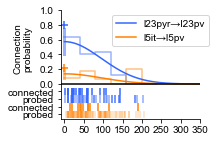

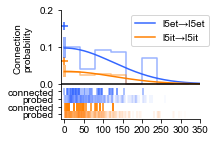

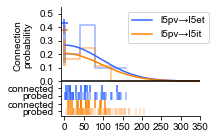

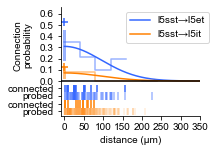

In [9]:
pyr_pv = [('l23pyr', 'l23pv'), ('l5it', 'l5pv')]
pv_et_it = [('l5pv', 'l5et'), ('l5pv', 'l5it')]
sst_et_it = [('l5sst', 'l5et'), ('l5sst', 'l5it')]
l5_et_it = [('l5et', 'l5et'), ('l5it', 'l5it')]

x_bins = np.arange(0, 500e-6, 40e-6)
x_vals = np.linspace(x_bins[0], x_bins[-1], 200)

fig_c, ax_c = plt.subplots(figsize=(2.5, 2))
plot_element_connectivity_profile(pyr_pv, matrix_connectivity, 1.0, ax_c, sigma=95e-6)
ax_c.set_xlabel('')

y_vals = np.arange(0, 1.1, 0.2)
ax_c.set_yticks([-0.1*4.1, -0.1*3.1, -0.1*2, -0.1] + list(y_vals))
ax_c.set_ylim(-0.1*4.7, 1.0)
# ax_c.set_yticklabels(['probed', 'connected', 'probed', 'connected'] + ['%0.1f'%x for x in y_vals])

fig_d, ax_d = plt.subplots(figsize=(2.5, 2))
plot_element_connectivity_profile(l5_et_it, matrix_connectivity, 0.2, ax_d, sigma=125e-6)
ax_d.set_xlabel('')

fig_e, ax_e = plt.subplots(figsize=(2.5, 2))
plot_element_connectivity_profile(pv_et_it, matrix_connectivity, 0.55, ax_e, sigma=95e-6)
ax_e.set_xlabel('')

fig_f, ax_f = plt.subplots(figsize=(2.5, 2))
plot_element_connectivity_profile(sst_et_it, matrix_connectivity, 0.66, ax_f, sigma=95e-6)


In [16]:
label_opts = {'size': '16pt', 'font': 'arial', 'weight': 'bold'}

figure_spec = [
    {'figure': fig_a, 'pos': (0, 20), 'label': 'A', 'label_opts': label_opts},
    {'figure': fig_b, 'pos': (0, 360), 'label': 'B', 'label_opts': label_opts},
    {'figure': fig_c, 'pos': (550, 370), 'label': 'C', 'label_opts': label_opts},
    {'figure': fig_d, 'pos': (550, 510), 'label': 'D', 'label_opts': label_opts},
    {'figure': fig_e, 'pos': (550, 650), 'label': 'E', 'label_opts': label_opts},
    {'figure': fig_f, 'pos': (550, 790), 'label': 'F', 'label_opts': label_opts},
]

compose_svg_figure(
    figure_spec, 
    size=("8in", "10in"), 
    filename=os.path.join('generated_svg', 'figure_02.svg'), 
    display=True
)

In [10]:
from aisynphys.ui.notebook import heatmap

def matrix_show(ax, results, pre_cell_classes, post_cell_classes, class_labels, cmap, norm, ctype='chemical', 
                distance_adjusted=False, corrections_applied=False, cbarlabel='Connection Probability', layer_lines=None, alpha=True):
    shape = (len(pre_cell_classes), len(post_cell_classes))
    cprob = np.zeros(shape)
    cprob_alpha = np.zeros(shape)
    cprob_str = np.zeros(shape, dtype=object)

    for i,pre_class in enumerate(pre_cell_classes):
        for j,post_class in enumerate(post_cell_classes):
            result = results[pre_class, post_class]
            if ctype == 'chemical':
                found = result['n_connected']
                if distance_adjusted:
                    cp, cp_lower_ci, cp_upper_ci = result['adjusted_connectivity']
                elif corrections_applied:
                    cp, cp_lower_ci, cp_upper_ci = result['connectivity_correction_fit'].cp_ci
                else:
                    cp, cp_lower_ci, cp_upper_ci = result['connection_probability']
            elif ctype == 'electrical':
                found = result['n_gaps']
                if distance_adjusted:
                    raise Exception('Distance adjustment for gap junctions not yet available')
                else:
                    cp, cp_lower_ci, cp_upper_ci = result['gap_probability']
            else:
                raise Exception('ctype must be one of "chemical" or "electrical"')
             
            cprob[i,j] = cp            
            
            # clip pmax and CIs to be within 0-1 for matrix annotations.
            cp = min(cp, 1)
            cp_upper_ci = min(cp_upper_ci, 1)
            cp_lower_ci = max(cp_lower_ci, 0)
        
            conn_str = "" if result['n_probed'] == 0 else "%d" % (found) 
            prob_str = "" if result['n_probed'] == 0 else "%d" % (result['n_probed'])
            cp_str = "" if result['n_probed'] == 0 else "%.2f" % (cp)
            ci_upper_str = "" if result['n_probed'] == 0 else "%.2f" % (cp_upper_ci)
            ci_lower_str = "" if result['n_probed'] == 0 else "%.2f" % (cp_lower_ci)
            cprob_str[i, j] = (cp_str, conn_str, prob_str, ci_upper_str, ci_lower_str)
            cprob_alpha[i,j] = 1.0 - 1.5 * max(cp_upper_ci - cp, cp - cp_lower_ci)

    # map connection probability to RGB colors
    mapper = matplotlib.cm.ScalarMappable(norm=norm, cmap=cmap)
    cprob_rgba = mapper.to_rgba(np.clip(cprob, 0.01, 1.0))

    # apply alpha based on confidence intervals
#     if alpha:
    cprob_rgba[:, :, 3] = np.clip(cprob_alpha, 0, 1)

    # generate lists of labels to display along the pre- and postsynaptic axes
    pre_class_labels = [class_labels[cls] for cls in pre_cell_classes]
    post_class_labels = [class_labels[cls] for cls in post_cell_classes]

    # draw the heatmap with axis labels and colorbar
    im, cbar = heatmap(cprob_rgba, pre_class_labels, post_class_labels, ax=ax, 
        ax_labels=('postsynaptic', 'presynaptic'),
        bg_color=(0.7, 0.7, 0.7),
        cmap=cmap, norm=norm, 
        cbarlabel=cbarlabel, 
        cbar_kw={'shrink':0.5})
    
    if layer_lines is not None:
        [ax.axhline(pos, color='white', linewidth=2) for pos in layer_lines]
        [ax.axvline(pos, color='white', linewidth=2) for pos in layer_lines]

    return im, cprob_str, cprob

def annotate(im, labels, data=None, textcolors=("black", "white"),
                     threshold=None, **textkw):
    pixels, _, _, _ = im.make_image(renderer=None, unsampled=True)

    # Set default alignment to center, but allow it to be
    # overwritten by textkw.
    kw = dict(horizontalalignment="center", verticalalignment="center", fontsize=16)
    kw.update(textkw)
    
    width, height = np.shape(labels)
    pixel_width = 1/width*7
    pixel_height = 1/height*7

    # Loop over the data and create a `Text` for each "pixel".
    # Change the text's color depending on the data.
    texts = []
    for i in range(data.shape[0]):
        for j in range(data.shape[1]):
            px_color = pixels[i,j]
            if isinstance(px_color, np.ma.core.MaskedArray):
                px_color = px_color.data
            color = textcolors[int(np.mean(px_color[:3]) < 128)]
            kw['color'] =  textcolors[int(np.mean(px_color[:3]) < 128)]
            cp, conn, prob, upper, lower = labels[i, j]
            im.axes.text(j, i, cp, **kw)
            im.axes.text(j-pixel_width, i-pixel_height, conn, dict(ha='left', va='top', color=color))
            im.axes.text(j-pixel_width, i+pixel_height, prob, dict(ha='left', va='bottom', color=color))
            im.axes.text(j+pixel_width, i-pixel_height, upper, dict(ha='right', va='top', color=color))
            im.axes.text(j+pixel_width, i+pixel_height, lower, dict(ha='right', va='bottom', color=color))
#             texts.append(text)
    return pixels

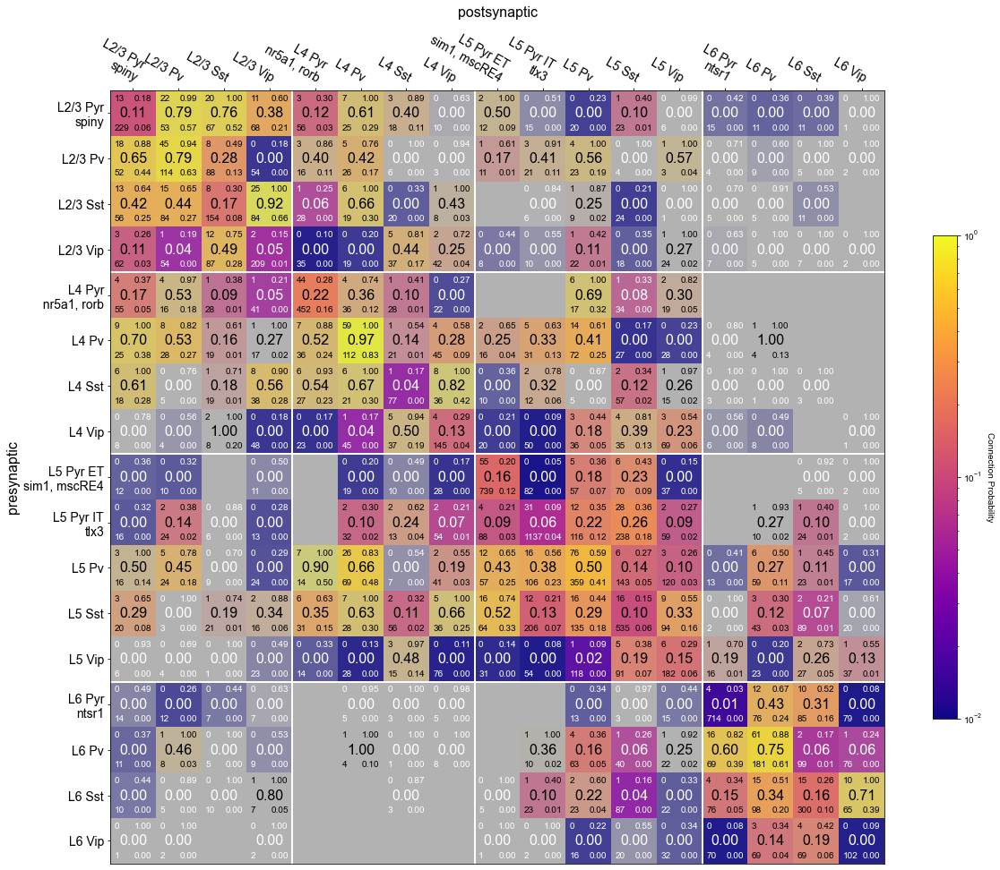

In [11]:
big_fig = plt.figure(figsize=(15,15))
ax = big_fig.add_axes([0,0,1,1])

im, cprob_str, cprob = matrix_show(
    ax=ax, 
    results=matrix_connectivity, 
    pre_cell_classes=cell_classes.values(), 
    post_cell_classes=cell_classes.values(), 
    class_labels=class_labels,
    cmap=cmap, 
    norm=norm,
    ctype='chemical',
    corrections_applied=True, 
    layer_lines=[3.5, 7.5, 12.5],
)

pixels = annotate(im, cprob_str, data=cprob)
_ = plt.setp(ax.get_xticklabels(), fontsize=14)
_ = plt.setp(ax.get_yticklabels(), fontsize=14)

In [20]:
#big_fig.savefig(save_path + 'supplement_big_matrix.svg', bbox_inches='tight')

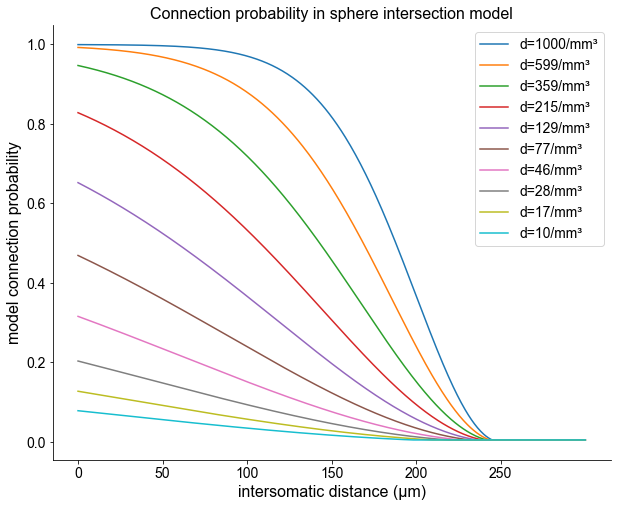

In [12]:
from aisynphys.connectivity import SphereIntersectionModel

sphere, ax = plt.subplots(figsize=(10, 8))
ticks = np.arange(0, 300e-6, 50e-6)
ax.set_xticks(ticks)
ax.set_xticklabels(['%0.0f'%(x*1e6) for x in ticks], fontsize=14)
plt.yticks(fontsize=14)
ax.set_xlabel('intersomatic distance (μm)', fontsize=16)
ax.set_ylabel('model connection probability', fontsize=16)
ax.set_title('Connection probability in sphere intersection model', fontsize=16)

x = np.linspace(0, 300e-6, 500)
# maximum synapse density of 1 per 100x100x100µm cube
max_density = 1 / 100e-6**3
densities = max_density * 10**np.linspace(0, -2, 10)
for density in densities:
    model = SphereIntersectionModel(density=density, size=125e-6)
    y = model.connection_probability(x)
    plt.plot(x, y, label="d=%0.0f/mm³"%(density/1e9))
    
ax.legend(fontsize=14);
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

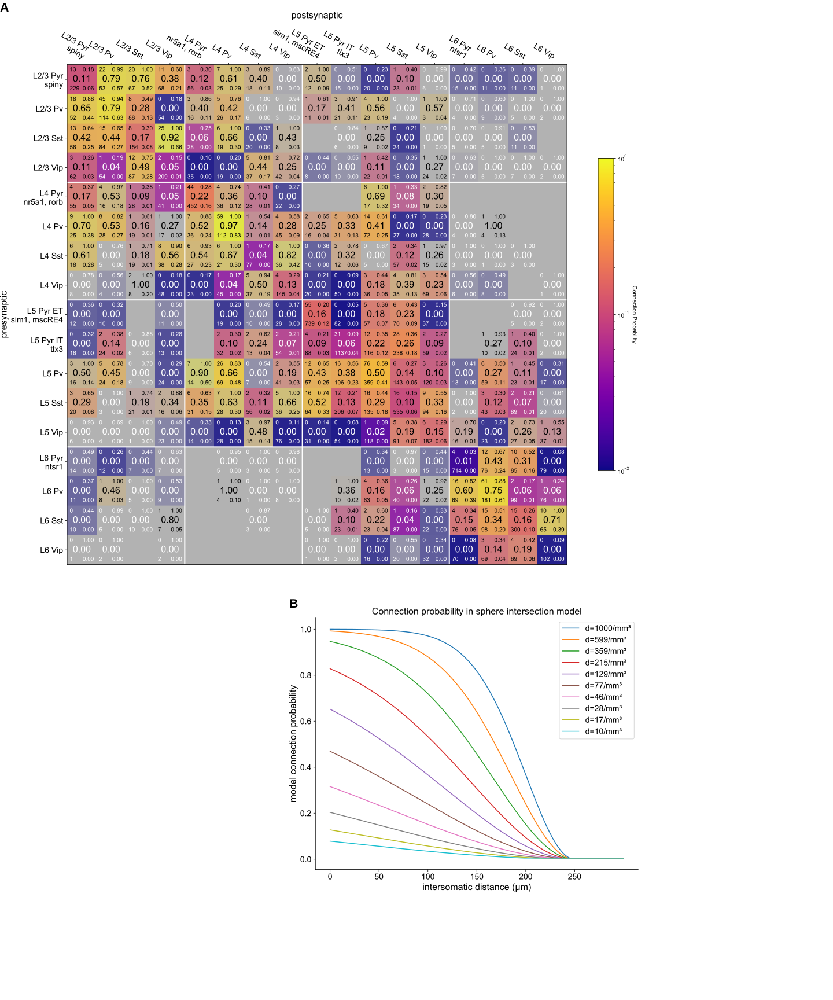

In [18]:
label_opts = {'size': '16pt', 'font': 'arial', 'weight': 'bold'}

figure_spec = [
    {'figure': big_fig, 'pos': (0, 20), 'label': 'A', 'label_opts': label_opts},
    {'figure': sphere, 'pos': (500, 1050), 'label': 'B', 'label_opts': label_opts},
]

compose_svg_figure(
    figure_spec, 
    size=("15in", "18in"), 
    filename=os.path.join('generated_svg', 'figure_s02.svg'), 
    display=True
)

In [13]:
from scipy import stats
import pandas as pd
import warnings; warnings.simplefilter('ignore')

conn_dict = {}
for pair_class, result in matrix_connectivity.items():
    pre_class, post_class = pair_class
    key = "%s->%s" % (pre_class.name, post_class.name)
    connections = result['connected_pairs']
    synapses = [p.synapse for p in connections if p.synapse is not None]
    if len(synapses) == 0:
        continue
    pmax = result['connectivity_correction_fit']['cp_ci'][0]
    cp_ci = result['connectivity_correction_fit']['cp_ci'][1:]
    if all([isinstance(ci, float) for ci in cp_ci]) is False:
        cp_ci = [cp[0] for cp in cp_ci if not isinstance(cp, float)]
    ci_diff = np.diff(cp_ci)
    pre_layer = pre_class.criteria['cortical_layer']
    post_layer = post_class.criteria['cortical_layer']
    if pre_layer == post_layer:
        layer = 'intra'
    else:
        if '6' in pre_layer and '6' in post_layer:
            layer = 'intra'
        else:
            layer = 'inter'

    abs_psp_amps = [np.abs(p.psp_amplitude)*1e3 for p in synapses if p.psp_amplitude is not None]  
    abs_psp_90 = [np.abs(p.dynamics.pulse_amp_90th_percentile)*1e3 for p in connections if p.dynamics is not None and p.dynamics.pulse_amp_90th_percentile is not None]
    conn_type = '%s' % (pre_class.output_synapse_type)
    
    conn_dict[key] = {'fit_cp': pmax[0] if not isinstance(pmax, float) else pmax,  
                      'fit_cp_ci': cp_ci,
                      'ci_diff': ci_diff[0] if len(ci_diff)>0 else np.nan,
                      'avg_abs_psp_amplitude': np.nanmean(abs_psp_amps),
                      'sem_psp_amplitude': stats.sem(abs_psp_amps, nan_policy='omit'),
                      'std_psp_amplitude': np.nanstd(abs_psp_amps),
                      'avg_abs_psp_90': np.nanmean(abs_psp_90),
                      'sem_psp_90': stats.sem(abs_psp_90, nan_policy='omit'),
                      'std_psp_90': np.nanstd(abs_psp_90),
                      'c_type': conn_type,  
                      'layer': layer}

In [14]:
conn_df = pd.DataFrame.from_dict(conn_dict, orient='index')
conn_df = conn_df[~conn_df['fit_cp'].isna()]
conn_df = conn_df[~conn_df['ci_diff'].isna()]
print(len(conn_df))
conn_df.head()

143


,fit_cp,fit_cp_ci,ci_diff,avg_abs_psp_amplitude,sem_psp_amplitude,std_psp_amplitude,avg_abs_psp_90,sem_psp_90,std_psp_90,c_type,layer
l23pyr->l23pyr,0.108742,"(0.06083089723112546, 0.17542472755017957)",0.114594,0.186296,0.057997,0.153445,0.398314,0.078302,0.221470,ex,intra
l23pyr->l23pv,0.792801,"(0.5734884550083581, 0.9856051467909872)",0.412117,0.409156,0.109320,0.423395,0.640529,0.122650,0.475020,ex,intra
l23pyr->l23sst,0.762527,"(0.5191695301743444, 1.0103927352779947)",0.491223,0.332392,0.116774,0.452264,1.749927,0.367264,1.422406,ex,intra
l23pyr->l23vip,0.381115,"(0.20904851734938565, 0.6014053210692559)",0.392357,0.601115,0.159803,0.451992,1.831817,0.233662,0.660895,ex,intra
l23pyr->l4pyr,0.121607,"(0.031022277866461348, 0.2990788007286067)",0.268057,0.132099,NaN,0.000000,0.287410,NaN,0.000000,ex,inter


In [15]:
from sklearn.datasets import make_regression
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import HuberRegressor
from sklearn.linear_model import RANSACRegressor
from sklearn.linear_model import TheilSenRegressor
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedKFold
from scipy.stats import spearmanr

# evaluate a model
def evaluate_model(X, y, model):
    # define model evaluation method
    cv = RepeatedKFold(n_splits=5, n_repeats=3, random_state=1)
    # evaluate model
    scores = cross_val_score(model, X, y, scoring='neg_mean_absolute_error', cv=cv, n_jobs=-1)
    # force scores to be positive
    return np.absolute(scores)

def plot_best_fit(X, y, model, ax, color, label='', weights=None):
    fit = model.fit(X, y, sample_weight=weights)
    ax.scatter(X, y, color=(color+ (0.5,)))
    x_vals = np.linspace(X.min(), X.max(), 200)
    fit_prediction = fit.predict(x_vals.reshape(len(x_vals), 1))
#     fit_ci = fit.conf_int(alpha=0.5)
#     ax.plot(x_vals, fit_ci, color=color+(0.5,))
    spear_corr, p = spearmanr(X, y)
    label = label + 'corr: %0.2f, p: %0.3f' % (spear_corr, p)
    ax.plot(x_vals, fit_prediction, color=color, label=label)
    ax.legend(loc='upper right')
    return fit

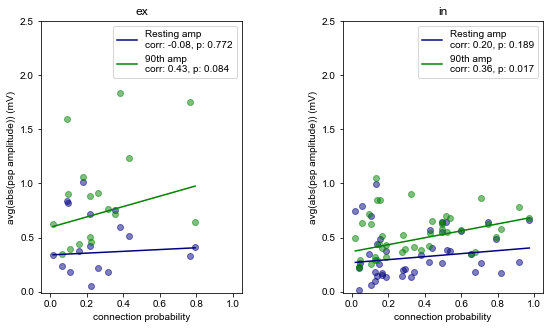

In [57]:
fig, ax = plt.subplots(1, 2, figsize=(9, 5))
plt.subplots_adjust(hspace=0.25, wspace=0.5)

intra_layer = conn_df[conn_df['layer']=='intra']
for j, c_type in enumerate(conn_df['c_type'].unique()):
    all_data = conn_df[conn_df['c_type']==c_type]
    all_data = all_data[~all_data['avg_abs_psp_amplitude'].isna()]
    amp_90 = all_data[~all_data['avg_abs_psp_90'].isna()]
    data = all_data[all_data['layer']=='intra']
    data_90 = amp_90[amp_90['layer']=='intra']
#     ax[0,i].set_title(c_type + ': all')
#     ax[1,i].set_title(c_type + ': intra')
#     for j, (data, data_90) in enumerate([intra, intra_90]):
    x = data['fit_cp'].to_numpy(dtype='float')
    x = x.reshape(-1, 1)
    y = data['avg_abs_psp_amplitude'].to_numpy(dtype='float')
    weights = data.apply(lambda row: 1 / (row['ci_diff'] + row['std_psp_amplitude']), axis=1).to_numpy(dtype='float')
    y_90 = data['avg_abs_psp_90'].to_numpy(dtype='float')
    weights_90 = data.apply(lambda row: 1 / (row['ci_diff'] + row['std_psp_90']), axis=1).to_numpy(dtype='float')
    reg_fit = plot_best_fit(x, y, HuberRegressor(), ax[j], (0, 0, 0.5), label='Resting amp\n', weights=weights)
    reg_fit_90 = plot_best_fit(x, y_90, HuberRegressor(), ax[j], (0, 0.5, 0), label='90th amp\n', weights=weights_90)
    ax[j].set_xlabel('connection probability')
    ax[j].set_ylabel('avg(abs(psp amplitude)) (mV)')
    ax[j].set_ylim(-.01, 2.5)
    ax[j].set_xlim(-0.05, 1.05)
    ax[j].set_title(c_type)


In [155]:
result['connectivity_correction_fit']['cp_ci'][1:]

(array([0.00229882]), array([0.17106504]))

In [16]:
from scipy.stats import chi2_contingency
import numpy as np
import pandas as pd

In [17]:
layer_table = np.array([
    [216, 1299], #L2/3
    [151, 1012], #L4
    [337, 4581], #L5
    [157, 2072], #L6
])

chi2, p, dof, expected = chi2_contingency(layer_table)
print(chi2, p)

113.81166112510249 1.659250976296165e-24


In [18]:
layer_names = ['L2/3', 'L4', 'L5', 'L6']
pair_wise = {}

for i, layer1 in enumerate(layer_table):
    for j, layer2 in enumerate(layer_table):
        if i==j:
            continue
        if (layer_names[j], layer_names[i]) in pair_wise.keys():
            continue
        chi2, p, dof, expected = chi2_contingency(np.array([layer1, layer2]))
        pair_wise[(layer_names[i], layer_names[j])] = {'chi2': chi2, 'pval': p}

pair_wise_df = pd.DataFrame.from_dict(pair_wise, orient='index')
print(0.05/len(pair_wise_df))
pair_wise_df

0.008333333333333333


chi2          pval
L2/3 L4   0.798145  3.716486e-01
     L5  79.889431  3.959589e-19
     L6  51.526638  7.063219e-13
L4   L5  47.077983  6.821771e-12
     L6  31.948844  1.582865e-08
L5   L6   0.059918  8.066260e-01